## Pokeman_DCGAN

In this notebook we are going to implement Pokemons-which doesn't exist through the help of Deep Convolutional GANs (<cite>https://arxiv.org/abs/1511.06434</cite>).

The dataset that we use is obtained from Kaggle <cite>https://www.kaggle.com/vishalsubbiah/pokemon-images-and-types</cite>.

So, lets get started!

At first lets import the necessary packages.

In [1]:
## importing the necessary packages ##

import torch
import torchvision

from torch import nn
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid

import numpy as np
import matplotlib.pyplot as plt

The first thing I am going to do is just import our images from the <code>images</code> folder using the <code>ImageFolder</code> method.

But to transform the images to tensors we need to apply the <code>transforms.ToTensor()</code> attribute to our <code>ImageFolder</code> method. Furthermore we are trying to normalize the images to a value of [-1,1] hence will also implement a normalization. 

One more thing is that we are trying to implement the original DCGAN, hence we will utilize <code>transforms.Resize</code> to transform the images into size of 64 * 64.

In [2]:
## Tranasformations ##

trans = transforms.Compose([
    transforms.Resize((64 , 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5 , ) , (0.5 , ))
])

## Loading the data ##

pok_data = ImageFolder(root = 'images',
                       transform = trans)

And done. Lets check one of the examples [image shape]. Also the length of the dataset and the maximum and the minimum values.

In [3]:
## Length of the dataset ##

print('Length :' , len(pok_data))

## Shape of an image ##
print('Shape of an image:' , pok_data[0][0].shape)

## Maximum and Minimum Values ##
print('Max Value :' , torch.max(pok_data[0][0]))
print('Min Value :' , torch.min(pok_data[0][0]))

Length : 809
Shape of an image: torch.Size([3, 64, 64])
Max Value : tensor(1.)
Min Value : tensor(-1.)


And everything is sorted.

Now with our datasets formed, lets build our <code>DataLoader</code>.

In [4]:
## Creating Dataloader ##

pok_dataloader = DataLoader(dataset = pok_data,
                            batch_size = 16,
                            shuffle = True)

Done!

Lets visualize one of the batches of our dataloader through <b>matplotib</b> and <code>make_grid</code> method.

But to visualize we need to denormalize the images to a range of (0,1) to view it.

In [5]:
## Denormalization function ##

def denormalize(img):
    return img * 0.5 + 0.5

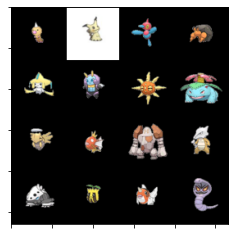

In [7]:
## Visualizing a batch of images ##

for img , _ in pok_dataloader:
    figure , ax = plt.subplots(figsize = (4 , 4))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    plt.imshow(make_grid(denormalize(img) , 4).permute(1 , 2 , 0))
    break

Cool. Everything is okay!

Now to make use of the GPU, we need to define some functions which relocates data to device.

Furthermore to define a GPU dataloader lets depict a new class datatype. 

In [8]:
## Utility function to transfer data to GPU ##

## Device ##

def get_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    

## Transfer to device ##

def transfer_data(data , device):
    if isinstance(data , (tuple , list)):
        return [transfer_data(each_data , device) for each_data in data]
    return data.to(device , non_blocking = True)

In [9]:
## DataLoader Class ##

class gpu_dataloader:
    
    def __init__(self , dl , device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        for batch in self.dl:
            yield transfer_data(batch , self.device)
            
    def __len__(self):
        return len(self.dl)

Now, lets initialize our dataloader objects.

In [10]:
## Setting the device ##

device = get_device()

## Setting the gpu dataloaders ##

pok_dl = gpu_dataloader(pok_dataloader , device)

And done!!

Now its time to build our model.

Paying homage to the original paper of DCGAN we are going to implement the Generator model just like it did by the following architecture.

1. Input noise of vector of size 100.
2. Transpose convolution to size 4 * 4 * 1024
3. Transpose convolution to size 8 * 8 * 512
4. Transpose convolution to 16 * 16 * 256
5. Transpose convolution to 32 * 32 * 128
6. Transpose convolution to 64 * 64 * 3

Put in batch normalization in between Transpose Convolution and the activation function in all modules except for the last one.

The activation functions should be ReLU in all the layers except the last one which would take in tanh.

In [11]:
## Defing Generator ##

class Generator(nn.Module):
    
    def __init__(self , img_channels = 3 , noise_channel = 100 , hidden_channels = 64):
        super().__init__()
        self.noise_channel = noise_channel
        self.gen = nn.Sequential(
        self.gen_block(noise_channel , hidden_channels * 16 , 4 , 1 , 0), ## 4 * 4
        self.gen_block(hidden_channels * 16 , hidden_channels * 8 , 4 , 2 , 1), ## 8 * 8
        self.gen_block(hidden_channels * 8 , hidden_channels * 4 , 4 , 2 , 1), ## 16 * 16
        self.gen_block(hidden_channels * 4 , hidden_channels * 2 , 4 , 2 , 1), ## 32 * 32
        
        ## final layer ##
        
        nn.ConvTranspose2d(in_channels = hidden_channels * 2 ,
                           out_channels = img_channels , 
                           kernel_size = 4 , 
                           stride = 2,
                           padding = 1),
        nn.Tanh()
        )
        
    def gen_block(self , in_channels , out_channels , kernel_size , stride , padding):
        return nn.Sequential(
        nn.ConvTranspose2d(in_channels = in_channels ,
                           out_channels = out_channels , 
                           kernel_size = kernel_size , 
                           stride = stride,
                           padding = padding),
        nn.BatchNorm2d(out_channels),
        nn.ReLU()
        )
    
    def forward(self , noise):
        noise = noise.view(noise.shape[0] , self.noise_channel , 1 , 1)
        return self.gen(noise)
    

## Defining noise ##

def generate_noise(num_samples , noise_channel , device):
    return torch.randn(num_samples , noise_channel , device = device)

And boom!

Similarly lets define the Discriminator!

In [12]:
## Defining Discriminator ##

class Discriminator(nn.Module):
    
    def __init__(self , img_channel = 3 , out_channel = 1 , hidden_channel = 64):
        super().__init__()
        self.disc = nn.Sequential(
        self.disc_block(img_channel , hidden_channel , 4 , 2 , 1), ## 32 * 32
        self.disc_block(hidden_channel , hidden_channel * 2 , 4 , 2 , 1), ## 16 * 16
        self.disc_block(hidden_channel * 2 , hidden_channel * 4 , 4 , 2 , 1), ## 8 * 8
        self.disc_block(hidden_channel * 4 , hidden_channel * 8 , 4 , 2 , 1), ## 4 * 4
        nn.Conv2d(in_channels = hidden_channel * 8 ,
                  out_channels = 1 , 
                  kernel_size = 4 , 
                  stride = 1,
                  padding = 0)
        )
        
    def disc_block(self , in_channels , out_channels , kernel_size , stride , padding):
        return  nn.Sequential(nn.Conv2d(in_channels = in_channels ,
                  out_channels = out_channels , 
                  kernel_size = kernel_size , 
                  stride = stride,
                  padding = padding),
                  nn.BatchNorm2d(out_channels),
                  nn.LeakyReLU(0.2))
        
    def forward(self , img):
        return self.disc(img)

Done! Lets set the generator and discriminator.

In [13]:
## Setting the generator and discriminator ##

gen = Generator()
disc = Discriminator()

In [14]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (4): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1

In [15]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Con

Boom! All the things are sorted!

Now all we need to do is initialize the weights of the generator and discriminator.

In [16]:
## Initializing weights ## 

def init_weight(m):
    if isinstance(m , (nn.Conv2d , nn.ConvTranspose2d)):
        torch.nn.init.normal_(m.weight , 0.0 , 0.02)
    elif isinstance(m , nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight , 0.0 , 0.02)
        torch.nn.init.constant_(m.bias , 0)
        

gen = gen.apply(init_weight)
disc = disc.apply(init_weight)

And it all done!

Now we must transfer our models to GPU.

In [17]:
## Transferring models to GPU ##

gen = gen.to(device)
disc = disc.to(device)

Boom! The models are transferred!!

Now during training we will be visualizing the images to get a hint of the training. So lets define a function which would visualize the images.

In [18]:
## Showing Images ##

def vis_img(img):
    figure , ax = plt.subplots(figsize = (4 , 4))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    plt.imshow(make_grid(denormalize(img.cpu()) , 4).permute(1 , 2 , 0))
    plt.show()

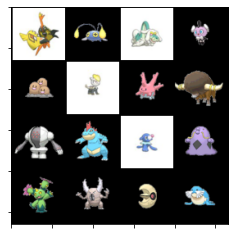

In [19]:
for img , _ in pok_dl:
    vis_img(img)
    break

And cool!

Lets visualize a batch of generator images too.

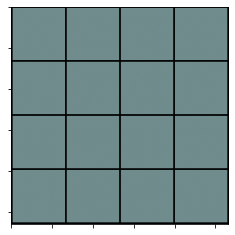

In [20]:
rand_noise = torch.randn(16 , 100)
rand_noise = rand_noise.reshape(rand_noise.shape[0] , rand_noise.shape[1] , 1 , 1)
gen_img = gen(rand_noise.to(device)).detach()


vis_img(gen_img)

Boom!

Now lets define our loss function and optimizer and then move on with our training.

In [21]:
## Loss Function ##

criterion = nn.BCEWithLogitsLoss()

## Optimizer ##

lr = 0.0002
beta1 = 0.5
beta2 = 0.999

gen_opt = torch.optim.Adam(params = gen.parameters() , lr = lr , betas = (beta1 , beta2))
disc_opt = torch.optim.Adam(params = disc.parameters() , lr = lr , betas = (beta1 , beta2))

Lets define the discriminator and generator trainings.

In [22]:
## Discriminator Training ##

def disc_training(gen , disc , real_img , criterion , batch_size , device):
    
    noise = generate_noise(batch_size , 100 , device)
    
    gen_img = gen(noise).detach()
    
    gen_pred = disc(gen_img)
    
    gen_target = torch.zeros_like(gen_pred , device = device)
    
    fake_loss = criterion(gen_pred , gen_target)
    
    
    real_pred = disc(real_img)
    
    real_target = torch.ones_like(real_pred , device = device)
    
    real_loss = criterion(real_pred , real_target)
    
    disc_loss = (fake_loss + real_loss) / 2
    
    return disc_loss

In [23]:
## Generator Training ##

def gen_training(gen , disc , criterion , batch_size , device):
    
    noise = generate_noise(batch_size , 100 , device)
    
    gen_img = gen(noise)
    
    gen_pred = disc(gen_img)
    
    gen_target = torch.ones_like(gen_pred , device = device)
    
    gen_loss = criterion(gen_pred , gen_target)
    
    return gen_loss

Lets begin training.

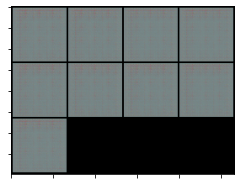

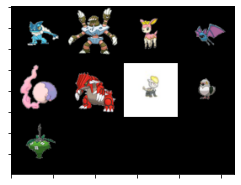

Epoch : [1 / 200] --> Generator Loss : 2.8503 , Discriminator Loss : 0.0663


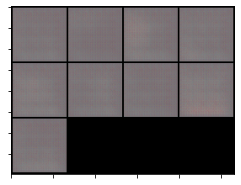

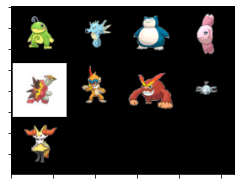

Epoch : [2 / 200] --> Generator Loss : 3.8569 , Discriminator Loss : 0.0316


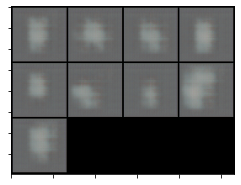

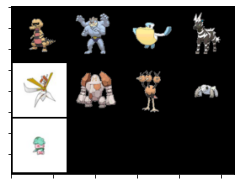

Epoch : [3 / 200] --> Generator Loss : 3.1153 , Discriminator Loss : 0.1524


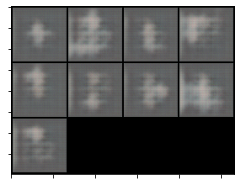

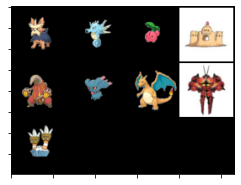

Epoch : [4 / 200] --> Generator Loss : 1.4267 , Discriminator Loss : 0.4282


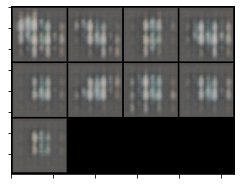

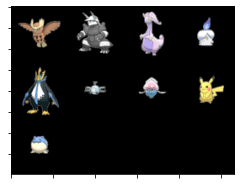

Epoch : [5 / 200] --> Generator Loss : 0.7891 , Discriminator Loss : 0.9710


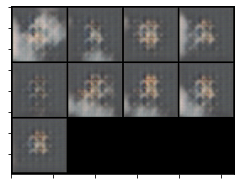

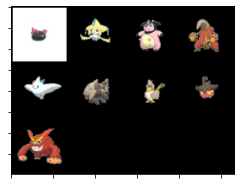

Epoch : [6 / 200] --> Generator Loss : 1.4245 , Discriminator Loss : 1.0502


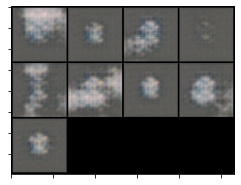

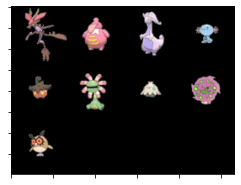

Epoch : [7 / 200] --> Generator Loss : 0.2100 , Discriminator Loss : 0.7466


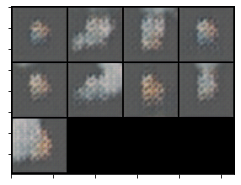

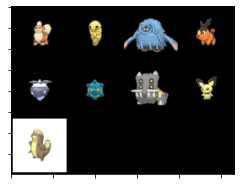

Epoch : [8 / 200] --> Generator Loss : 1.3790 , Discriminator Loss : 0.3266


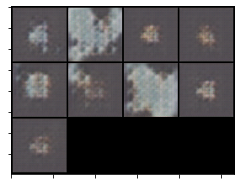

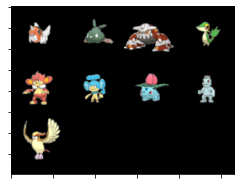

Epoch : [9 / 200] --> Generator Loss : 0.4466 , Discriminator Loss : 0.7742


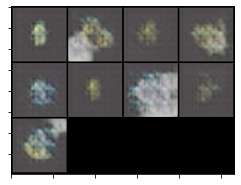

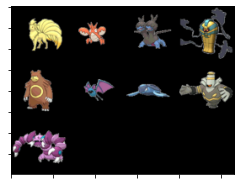

Epoch : [10 / 200] --> Generator Loss : 0.7930 , Discriminator Loss : 0.9825


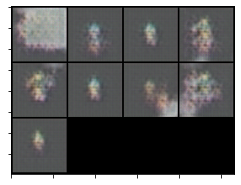

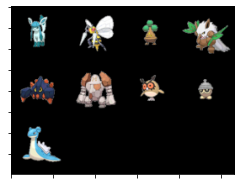

Epoch : [11 / 200] --> Generator Loss : 0.8935 , Discriminator Loss : 0.8576


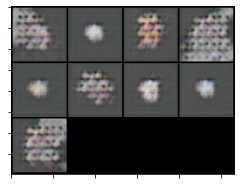

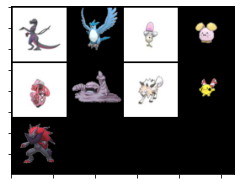

Epoch : [12 / 200] --> Generator Loss : 3.0223 , Discriminator Loss : 0.1162


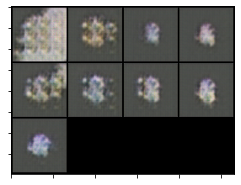

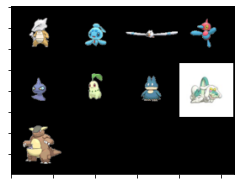

Epoch : [13 / 200] --> Generator Loss : 1.6632 , Discriminator Loss : 0.3003


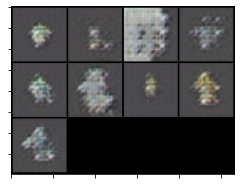

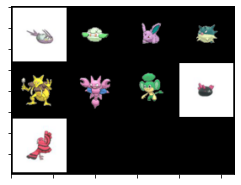

Epoch : [14 / 200] --> Generator Loss : 2.7026 , Discriminator Loss : 0.0623


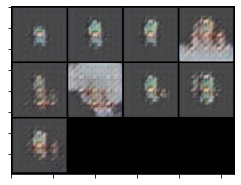

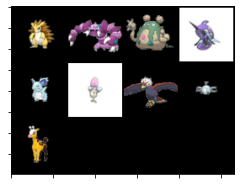

Epoch : [15 / 200] --> Generator Loss : 2.5782 , Discriminator Loss : 0.1519


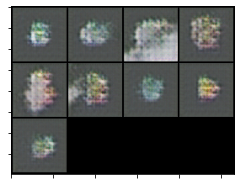

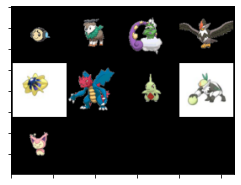

Epoch : [16 / 200] --> Generator Loss : 3.2120 , Discriminator Loss : 0.0823


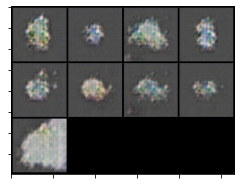

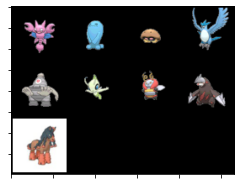

Epoch : [17 / 200] --> Generator Loss : 3.5673 , Discriminator Loss : 0.6289


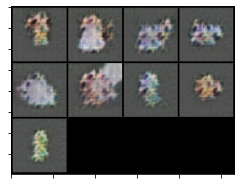

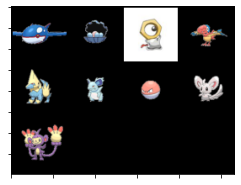

Epoch : [18 / 200] --> Generator Loss : 1.7901 , Discriminator Loss : 0.2394


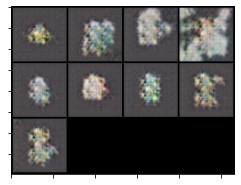

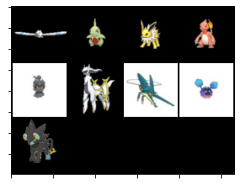

Epoch : [19 / 200] --> Generator Loss : 0.9659 , Discriminator Loss : 0.4123


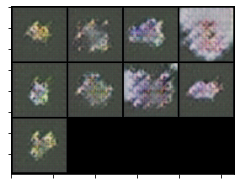

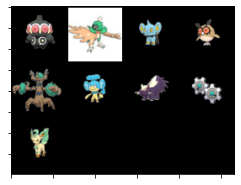

Epoch : [20 / 200] --> Generator Loss : 1.9520 , Discriminator Loss : 0.5364


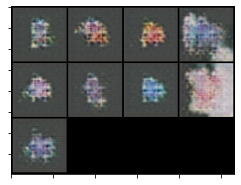

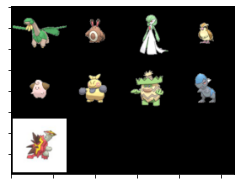

Epoch : [21 / 200] --> Generator Loss : 1.4305 , Discriminator Loss : 0.1799


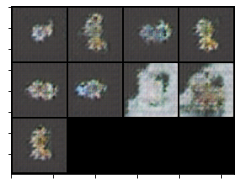

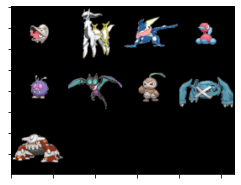

Epoch : [22 / 200] --> Generator Loss : 3.4984 , Discriminator Loss : 1.0657


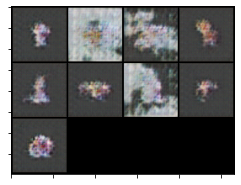

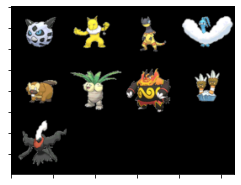

Epoch : [23 / 200] --> Generator Loss : 0.7297 , Discriminator Loss : 0.1900


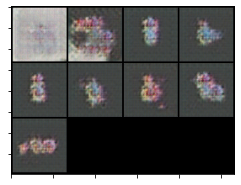

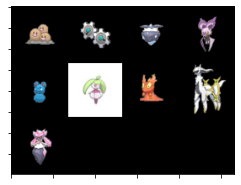

Epoch : [24 / 200] --> Generator Loss : 0.2317 , Discriminator Loss : 0.1567


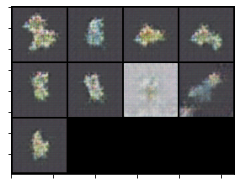

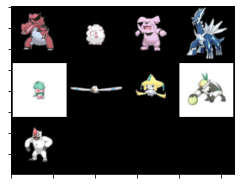

Epoch : [25 / 200] --> Generator Loss : 1.0634 , Discriminator Loss : 0.1207


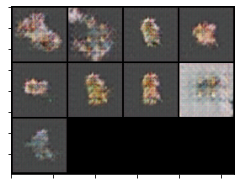

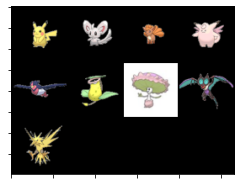

Epoch : [26 / 200] --> Generator Loss : 1.4029 , Discriminator Loss : 0.5593


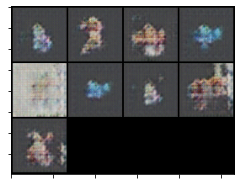

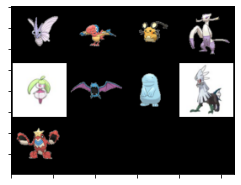

Epoch : [27 / 200] --> Generator Loss : 0.5491 , Discriminator Loss : 0.2115


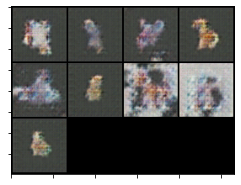

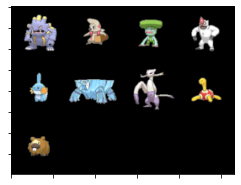

Epoch : [28 / 200] --> Generator Loss : 3.1388 , Discriminator Loss : 0.0930


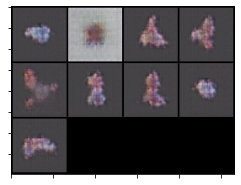

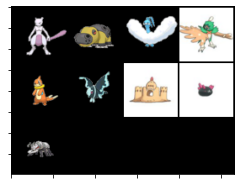

Epoch : [29 / 200] --> Generator Loss : 4.8542 , Discriminator Loss : 0.4134


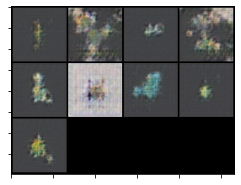

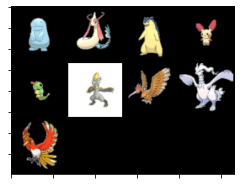

Epoch : [30 / 200] --> Generator Loss : 1.6965 , Discriminator Loss : 0.2445


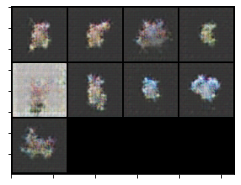

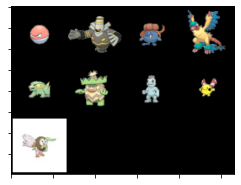

Epoch : [31 / 200] --> Generator Loss : 2.2018 , Discriminator Loss : 0.1229


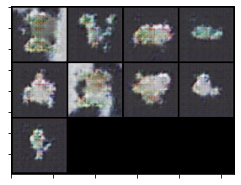

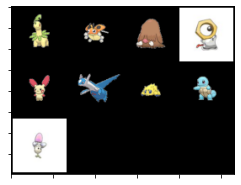

Epoch : [32 / 200] --> Generator Loss : 0.1024 , Discriminator Loss : 0.0386


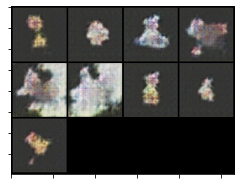

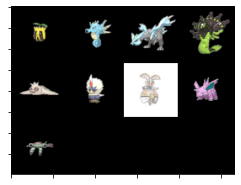

Epoch : [33 / 200] --> Generator Loss : 0.4134 , Discriminator Loss : 0.0477


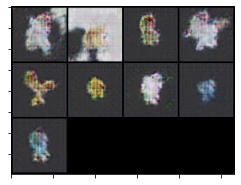

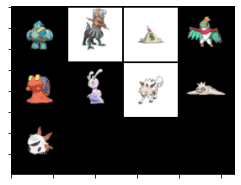

Epoch : [34 / 200] --> Generator Loss : 2.6058 , Discriminator Loss : 0.0246


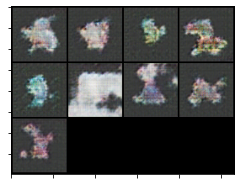

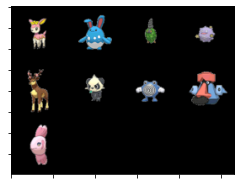

Epoch : [35 / 200] --> Generator Loss : 3.0109 , Discriminator Loss : 0.0283


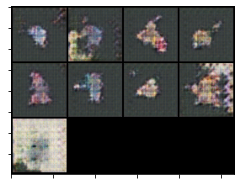

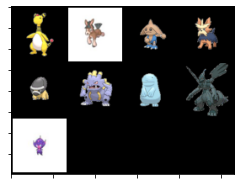

Epoch : [36 / 200] --> Generator Loss : 2.7941 , Discriminator Loss : 0.5010


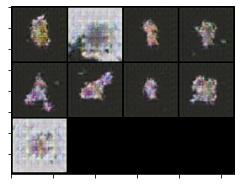

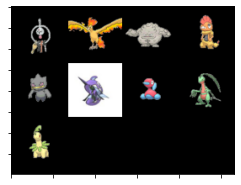

Epoch : [37 / 200] --> Generator Loss : 1.6219 , Discriminator Loss : 0.4188


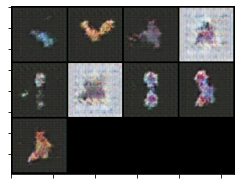

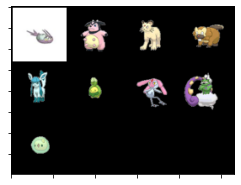

Epoch : [38 / 200] --> Generator Loss : 0.8017 , Discriminator Loss : 0.1122


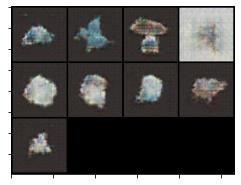

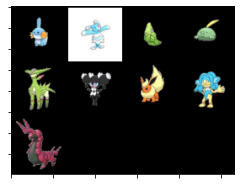

Epoch : [39 / 200] --> Generator Loss : 4.6992 , Discriminator Loss : 0.5612


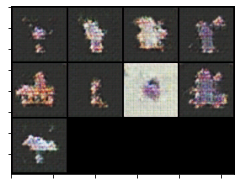

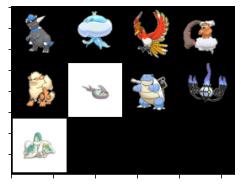

Epoch : [40 / 200] --> Generator Loss : 5.0168 , Discriminator Loss : 0.0725


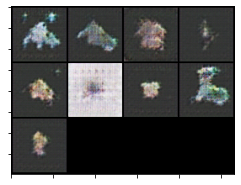

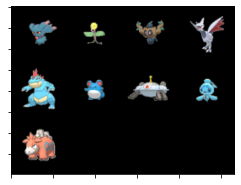

Epoch : [41 / 200] --> Generator Loss : 4.6036 , Discriminator Loss : 0.4813


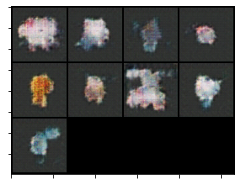

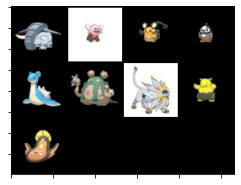

Epoch : [42 / 200] --> Generator Loss : 0.5154 , Discriminator Loss : 0.1110


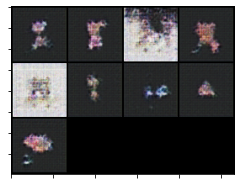

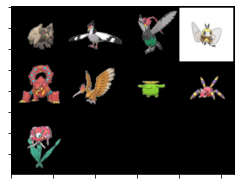

Epoch : [43 / 200] --> Generator Loss : 0.6503 , Discriminator Loss : 0.6135


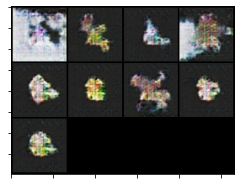

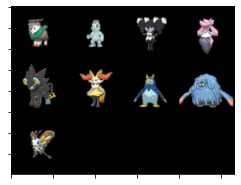

Epoch : [44 / 200] --> Generator Loss : 2.3626 , Discriminator Loss : 0.1110


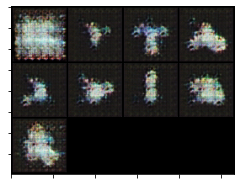

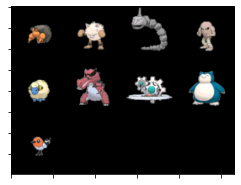

Epoch : [45 / 200] --> Generator Loss : 3.2313 , Discriminator Loss : 0.2319


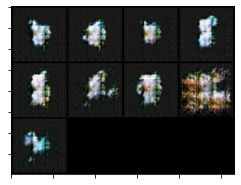

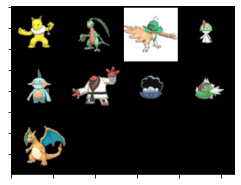

Epoch : [46 / 200] --> Generator Loss : 1.3464 , Discriminator Loss : 0.2619


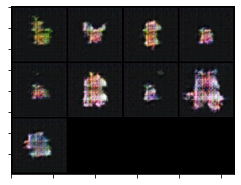

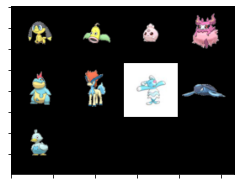

Epoch : [47 / 200] --> Generator Loss : 1.5185 , Discriminator Loss : 0.3541


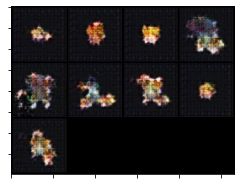

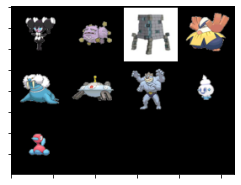

Epoch : [48 / 200] --> Generator Loss : 2.8179 , Discriminator Loss : 0.1037


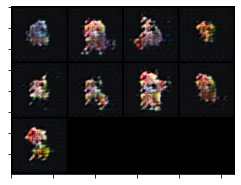

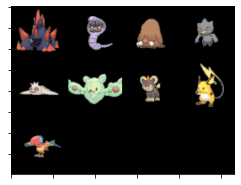

Epoch : [49 / 200] --> Generator Loss : 2.0589 , Discriminator Loss : 1.1835


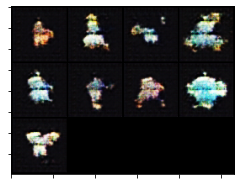

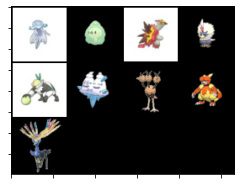

Epoch : [50 / 200] --> Generator Loss : 3.4280 , Discriminator Loss : 0.0241


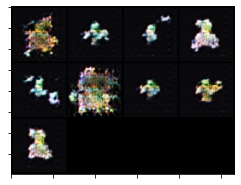

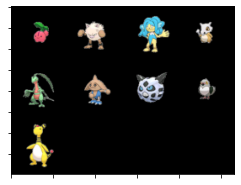

Epoch : [51 / 200] --> Generator Loss : 1.1938 , Discriminator Loss : 0.6000


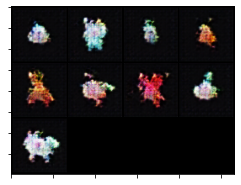

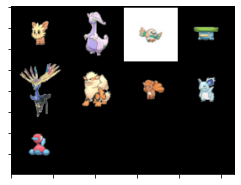

Epoch : [52 / 200] --> Generator Loss : 1.7201 , Discriminator Loss : 0.0695


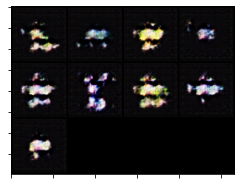

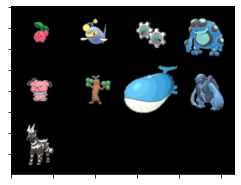

Epoch : [53 / 200] --> Generator Loss : 2.1677 , Discriminator Loss : 1.5755


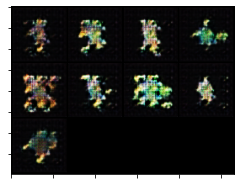

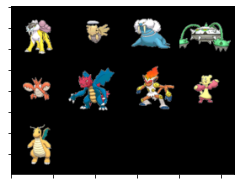

Epoch : [54 / 200] --> Generator Loss : 2.1729 , Discriminator Loss : 1.7199


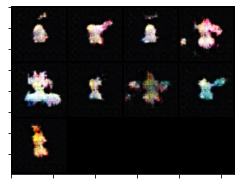

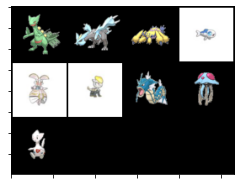

Epoch : [55 / 200] --> Generator Loss : 1.4951 , Discriminator Loss : 0.1209


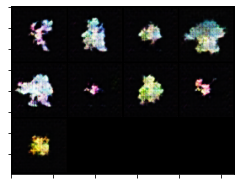

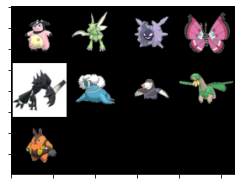

Epoch : [56 / 200] --> Generator Loss : 1.9351 , Discriminator Loss : 0.1067


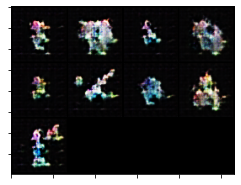

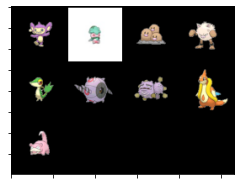

Epoch : [57 / 200] --> Generator Loss : 3.4537 , Discriminator Loss : 0.0234


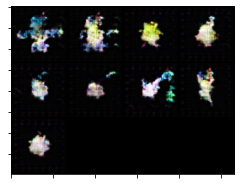

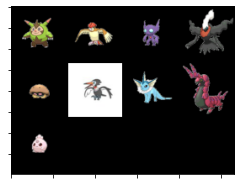

Epoch : [58 / 200] --> Generator Loss : 3.2292 , Discriminator Loss : 0.0257


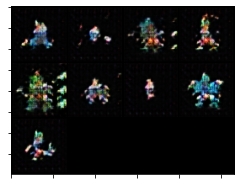

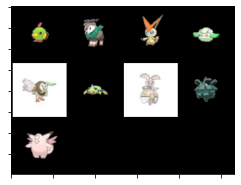

Epoch : [59 / 200] --> Generator Loss : 3.0302 , Discriminator Loss : 0.0391


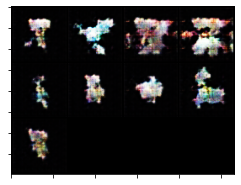

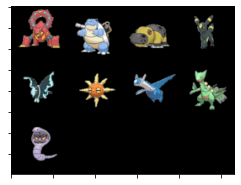

Epoch : [60 / 200] --> Generator Loss : 0.9275 , Discriminator Loss : 0.9617


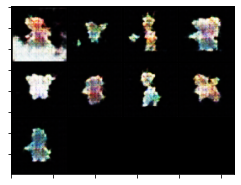

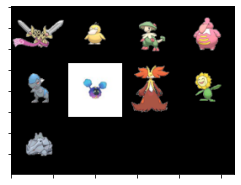

Epoch : [61 / 200] --> Generator Loss : 1.5908 , Discriminator Loss : 0.1945


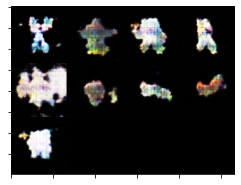

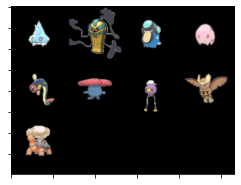

Epoch : [62 / 200] --> Generator Loss : 1.5031 , Discriminator Loss : 0.1950


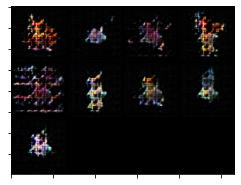

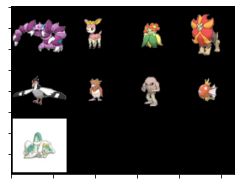

Epoch : [63 / 200] --> Generator Loss : 2.6422 , Discriminator Loss : 0.0775


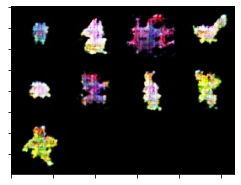

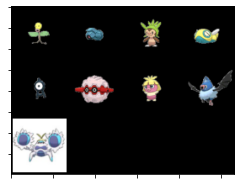

Epoch : [64 / 200] --> Generator Loss : 3.0206 , Discriminator Loss : 0.0452


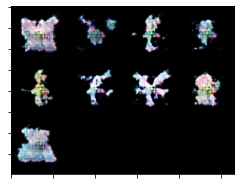

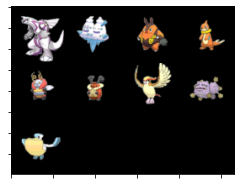

Epoch : [65 / 200] --> Generator Loss : 1.7868 , Discriminator Loss : 1.5044


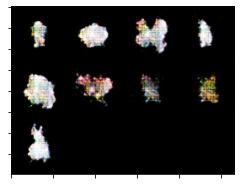

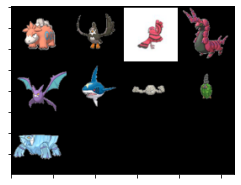

Epoch : [66 / 200] --> Generator Loss : 1.7351 , Discriminator Loss : 0.1537


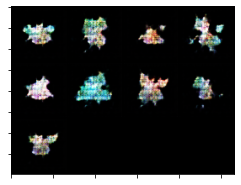

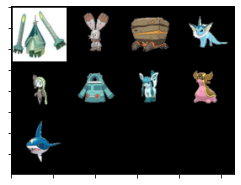

Epoch : [67 / 200] --> Generator Loss : 2.5057 , Discriminator Loss : 0.0635


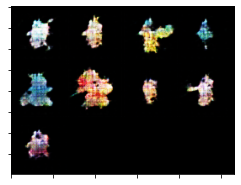

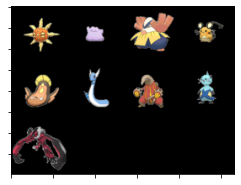

Epoch : [68 / 200] --> Generator Loss : 2.3823 , Discriminator Loss : 1.4226


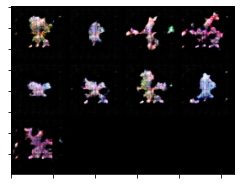

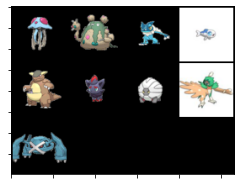

Epoch : [69 / 200] --> Generator Loss : 3.0788 , Discriminator Loss : 0.0303


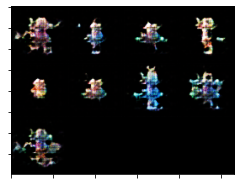

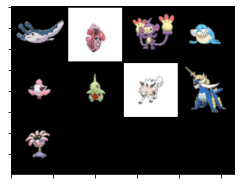

Epoch : [70 / 200] --> Generator Loss : 3.2677 , Discriminator Loss : 0.0293


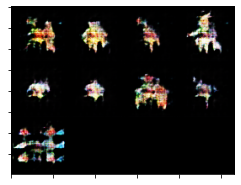

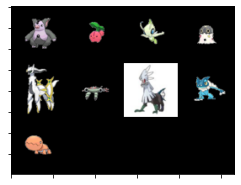

Epoch : [71 / 200] --> Generator Loss : 2.1734 , Discriminator Loss : 0.0586


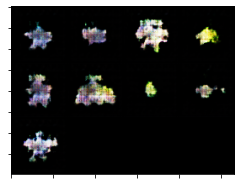

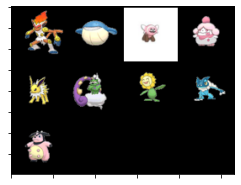

Epoch : [72 / 200] --> Generator Loss : 2.6992 , Discriminator Loss : 0.0552


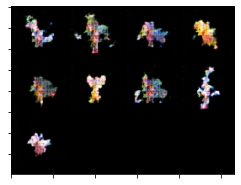

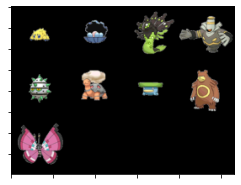

Epoch : [73 / 200] --> Generator Loss : 1.6320 , Discriminator Loss : 0.9850


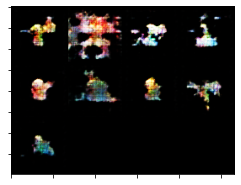

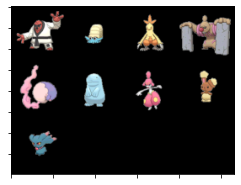

Epoch : [74 / 200] --> Generator Loss : 1.5467 , Discriminator Loss : 1.1433


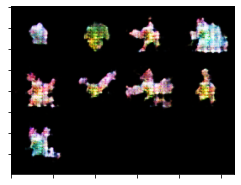

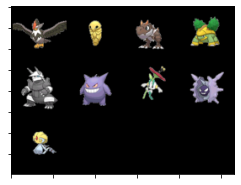

Epoch : [75 / 200] --> Generator Loss : 2.0277 , Discriminator Loss : 1.1293


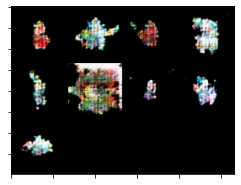

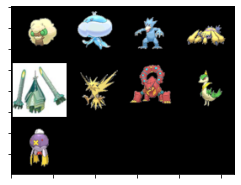

Epoch : [76 / 200] --> Generator Loss : 2.0834 , Discriminator Loss : 0.1220


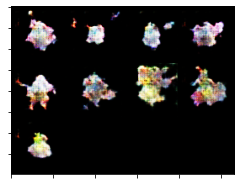

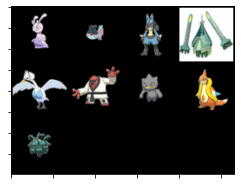

Epoch : [77 / 200] --> Generator Loss : 3.5423 , Discriminator Loss : 0.1932


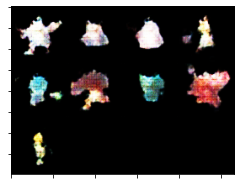

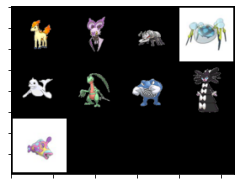

Epoch : [78 / 200] --> Generator Loss : 3.6256 , Discriminator Loss : 0.1925


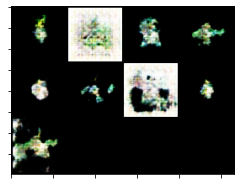

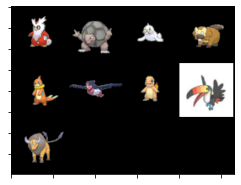

Epoch : [79 / 200] --> Generator Loss : 3.8285 , Discriminator Loss : 0.5627


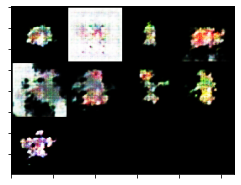

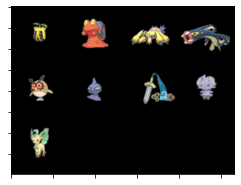

Epoch : [80 / 200] --> Generator Loss : 2.4369 , Discriminator Loss : 0.3106


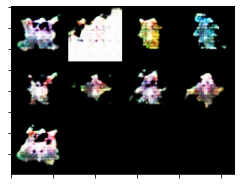

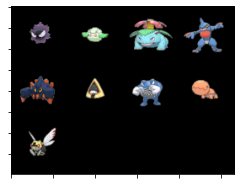

Epoch : [81 / 200] --> Generator Loss : 1.6225 , Discriminator Loss : 0.3434


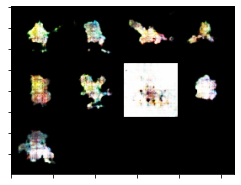

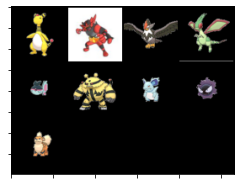

Epoch : [82 / 200] --> Generator Loss : 1.6026 , Discriminator Loss : 0.5918


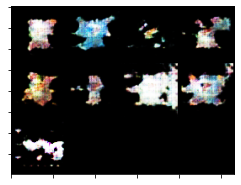

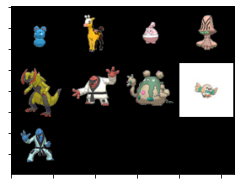

Epoch : [83 / 200] --> Generator Loss : 5.0994 , Discriminator Loss : 0.6422


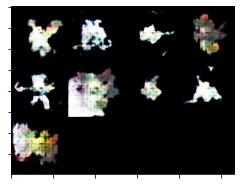

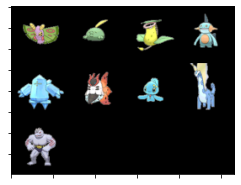

Epoch : [84 / 200] --> Generator Loss : 0.3413 , Discriminator Loss : 0.1184


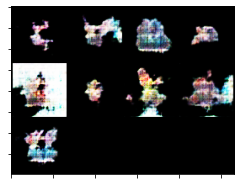

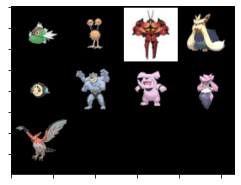

Epoch : [85 / 200] --> Generator Loss : 0.4915 , Discriminator Loss : 0.4181


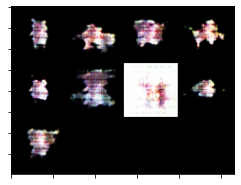

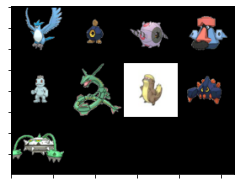

Epoch : [86 / 200] --> Generator Loss : 1.9146 , Discriminator Loss : 0.2909


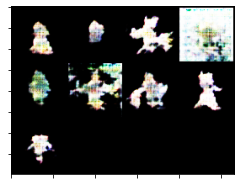

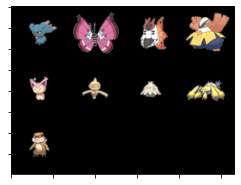

Epoch : [87 / 200] --> Generator Loss : 3.1542 , Discriminator Loss : 0.2911


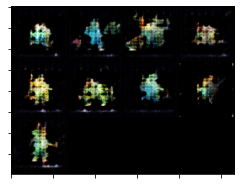

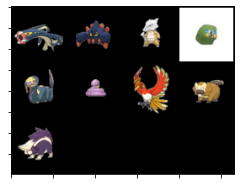

Epoch : [88 / 200] --> Generator Loss : 1.9395 , Discriminator Loss : 0.2431


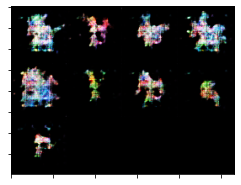

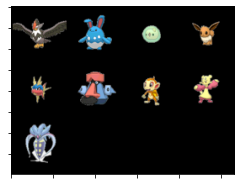

Epoch : [89 / 200] --> Generator Loss : 1.9772 , Discriminator Loss : 1.1911


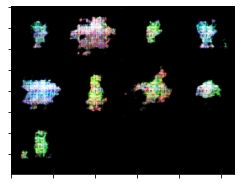

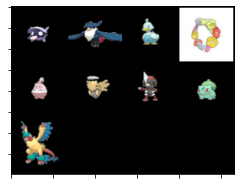

Epoch : [90 / 200] --> Generator Loss : 2.9803 , Discriminator Loss : 0.0366


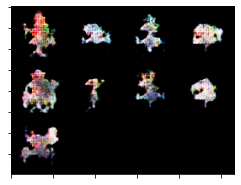

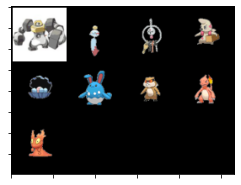

Epoch : [91 / 200] --> Generator Loss : 2.4718 , Discriminator Loss : 0.0655


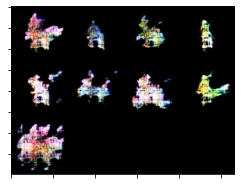

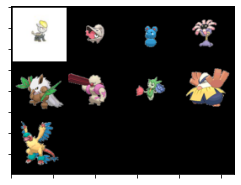

Epoch : [92 / 200] --> Generator Loss : 2.0557 , Discriminator Loss : 0.1186


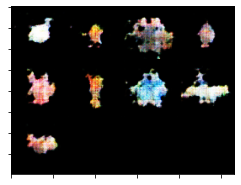

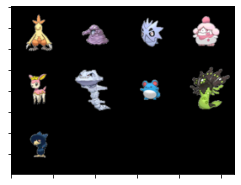

Epoch : [93 / 200] --> Generator Loss : 1.7148 , Discriminator Loss : 1.0209


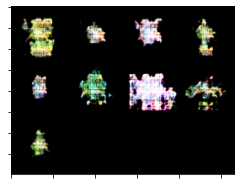

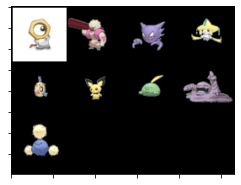

Epoch : [94 / 200] --> Generator Loss : 3.0088 , Discriminator Loss : 0.0393


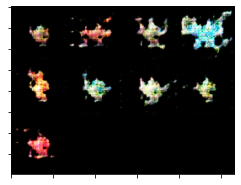

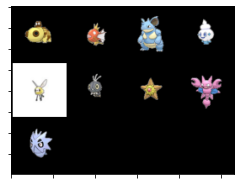

Epoch : [95 / 200] --> Generator Loss : 2.1121 , Discriminator Loss : 0.2945


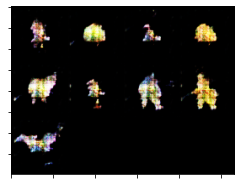

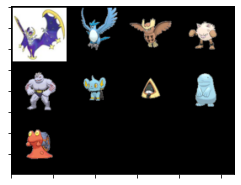

Epoch : [96 / 200] --> Generator Loss : 3.1153 , Discriminator Loss : 0.0406


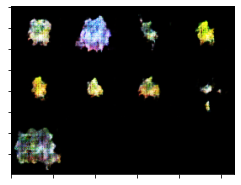

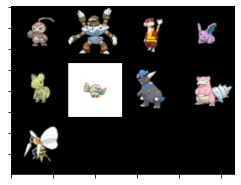

Epoch : [97 / 200] --> Generator Loss : 2.8793 , Discriminator Loss : 0.0376


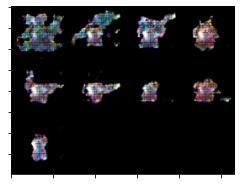

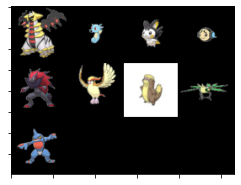

Epoch : [98 / 200] --> Generator Loss : 2.1721 , Discriminator Loss : 0.0510


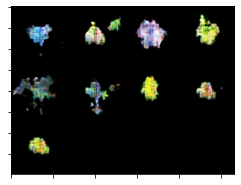

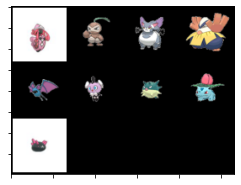

Epoch : [99 / 200] --> Generator Loss : 2.5703 , Discriminator Loss : 0.0851


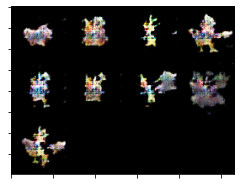

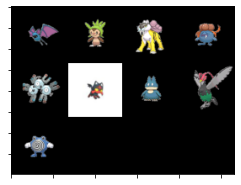

Epoch : [100 / 200] --> Generator Loss : 3.0582 , Discriminator Loss : 0.0383


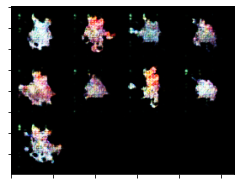

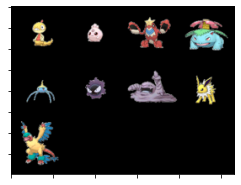

Epoch : [101 / 200] --> Generator Loss : 0.8776 , Discriminator Loss : 0.5483


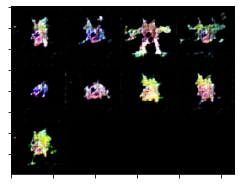

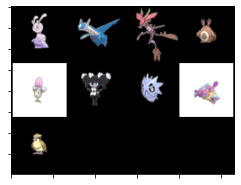

Epoch : [102 / 200] --> Generator Loss : 3.0897 , Discriminator Loss : 0.0305


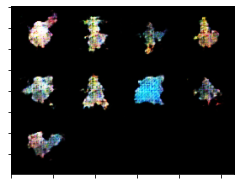

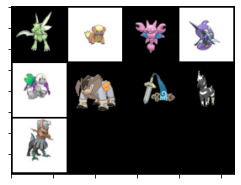

Epoch : [103 / 200] --> Generator Loss : 2.0310 , Discriminator Loss : 0.0888


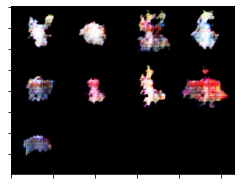

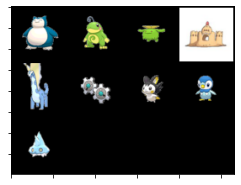

Epoch : [104 / 200] --> Generator Loss : 3.3636 , Discriminator Loss : 0.0308


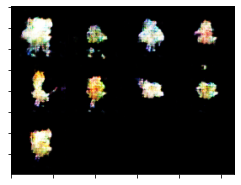

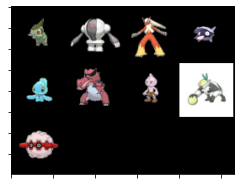

Epoch : [105 / 200] --> Generator Loss : 3.1903 , Discriminator Loss : 0.0304


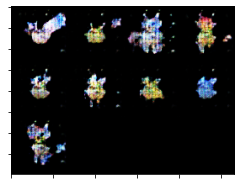

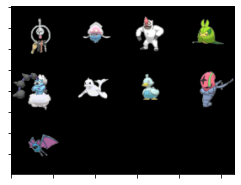

Epoch : [106 / 200] --> Generator Loss : 2.4693 , Discriminator Loss : 1.1722


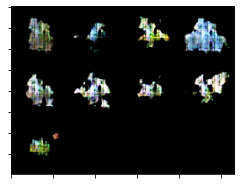

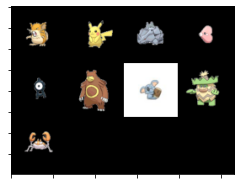

Epoch : [107 / 200] --> Generator Loss : 3.4553 , Discriminator Loss : 0.0252


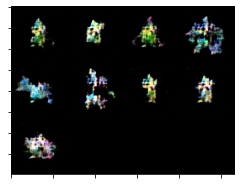

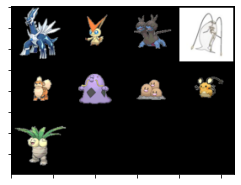

Epoch : [108 / 200] --> Generator Loss : 2.4052 , Discriminator Loss : 0.0407


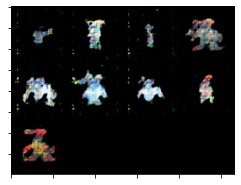

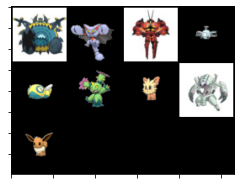

Epoch : [109 / 200] --> Generator Loss : 2.8643 , Discriminator Loss : 0.0482


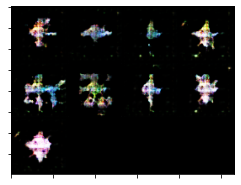

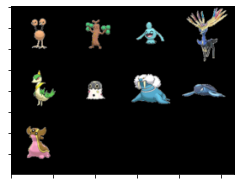

Epoch : [110 / 200] --> Generator Loss : 1.7357 , Discriminator Loss : 1.0046


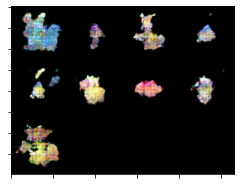

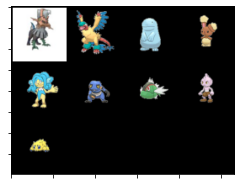

Epoch : [111 / 200] --> Generator Loss : 2.6143 , Discriminator Loss : 0.0577


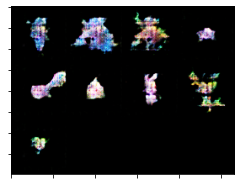

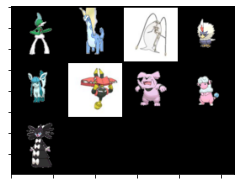

Epoch : [112 / 200] --> Generator Loss : 2.2377 , Discriminator Loss : 0.1165


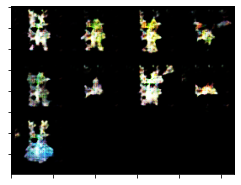

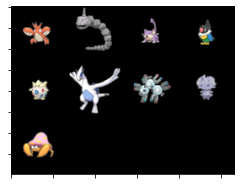

Epoch : [113 / 200] --> Generator Loss : 1.3688 , Discriminator Loss : 0.5046


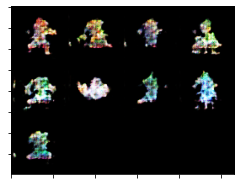

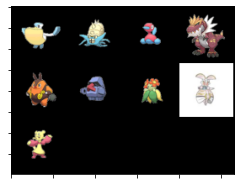

Epoch : [114 / 200] --> Generator Loss : 3.1685 , Discriminator Loss : 0.0272


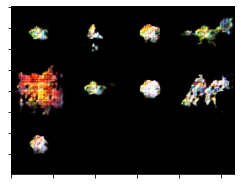

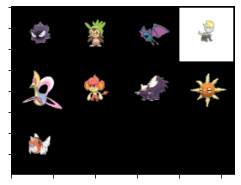

Epoch : [115 / 200] --> Generator Loss : 2.7005 , Discriminator Loss : 0.0658


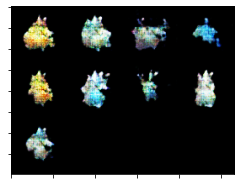

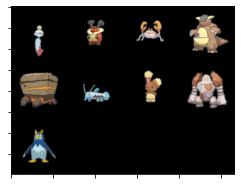

Epoch : [116 / 200] --> Generator Loss : 2.1479 , Discriminator Loss : 1.0571


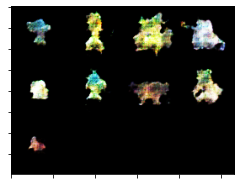

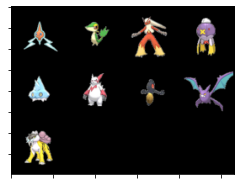

Epoch : [117 / 200] --> Generator Loss : 1.6208 , Discriminator Loss : 0.4409


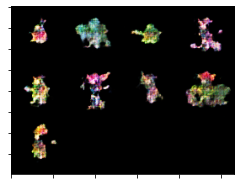

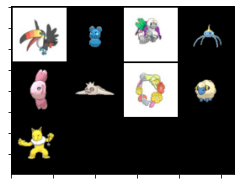

Epoch : [118 / 200] --> Generator Loss : 2.1341 , Discriminator Loss : 0.0764


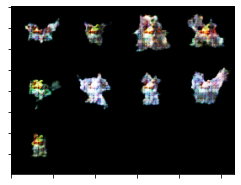

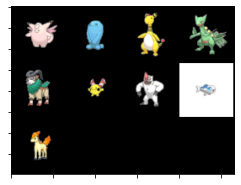

Epoch : [119 / 200] --> Generator Loss : 2.6195 , Discriminator Loss : 0.0528


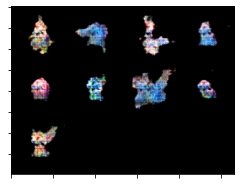

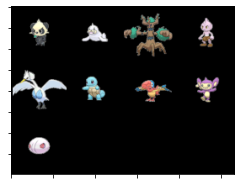

Epoch : [120 / 200] --> Generator Loss : 1.5721 , Discriminator Loss : 0.7213


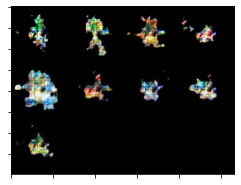

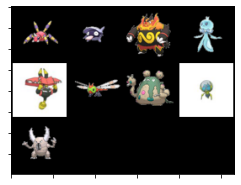

Epoch : [121 / 200] --> Generator Loss : 3.2487 , Discriminator Loss : 0.0211


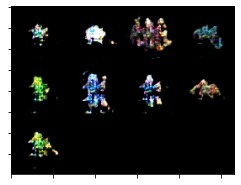

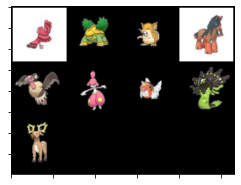

Epoch : [122 / 200] --> Generator Loss : 3.3121 , Discriminator Loss : 0.0315


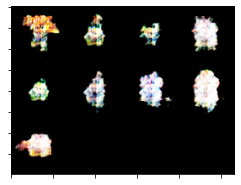

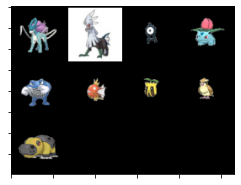

Epoch : [123 / 200] --> Generator Loss : 2.4363 , Discriminator Loss : 0.2109


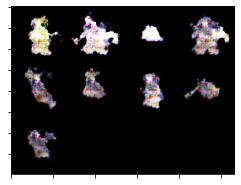

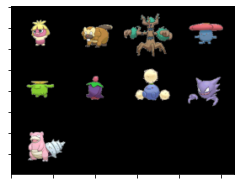

Epoch : [124 / 200] --> Generator Loss : 1.2264 , Discriminator Loss : 0.4908


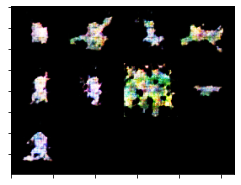

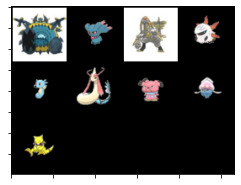

Epoch : [125 / 200] --> Generator Loss : 2.9330 , Discriminator Loss : 0.0830


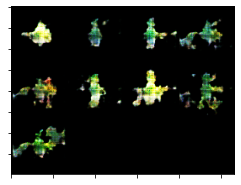

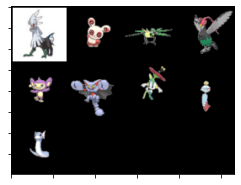

Epoch : [126 / 200] --> Generator Loss : 3.2950 , Discriminator Loss : 0.0367


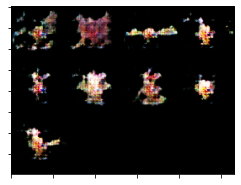

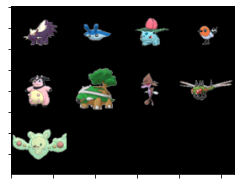

Epoch : [127 / 200] --> Generator Loss : 1.2266 , Discriminator Loss : 0.7828


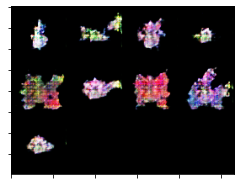

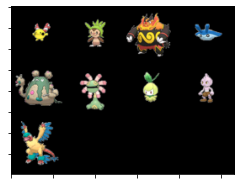

Epoch : [128 / 200] --> Generator Loss : 1.8233 , Discriminator Loss : 0.4790


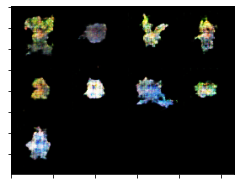

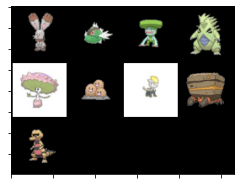

Epoch : [129 / 200] --> Generator Loss : 3.1554 , Discriminator Loss : 0.0352


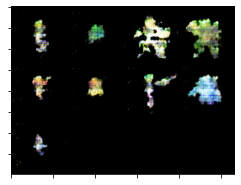

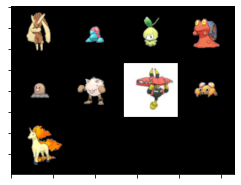

Epoch : [130 / 200] --> Generator Loss : 3.1936 , Discriminator Loss : 0.0327


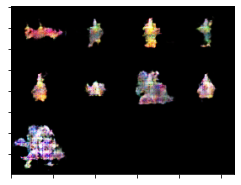

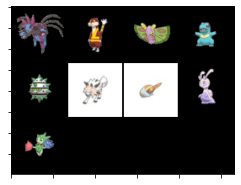

Epoch : [131 / 200] --> Generator Loss : 2.5872 , Discriminator Loss : 0.0996


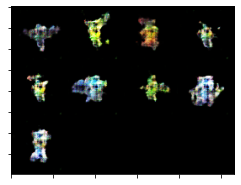

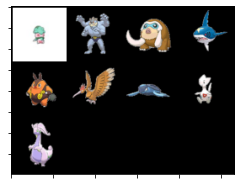

Epoch : [132 / 200] --> Generator Loss : 3.0328 , Discriminator Loss : 0.0257


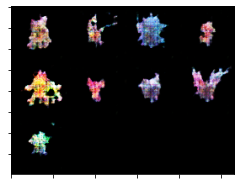

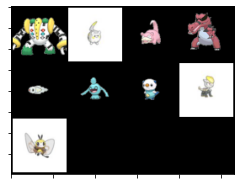

Epoch : [133 / 200] --> Generator Loss : 3.3061 , Discriminator Loss : 0.0351


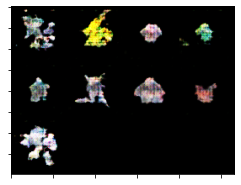

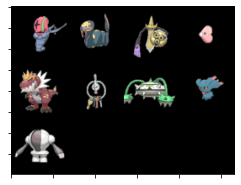

Epoch : [134 / 200] --> Generator Loss : 2.1036 , Discriminator Loss : 1.1042


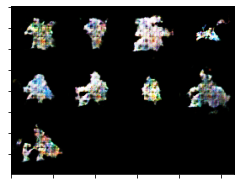

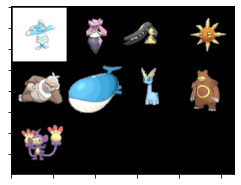

Epoch : [135 / 200] --> Generator Loss : 3.2626 , Discriminator Loss : 0.0815


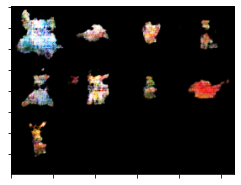

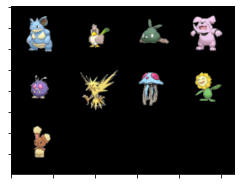

Epoch : [136 / 200] --> Generator Loss : 2.0881 , Discriminator Loss : 0.8883


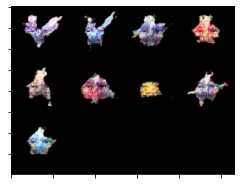

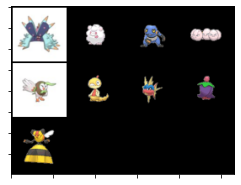

Epoch : [137 / 200] --> Generator Loss : 2.9875 , Discriminator Loss : 0.0369


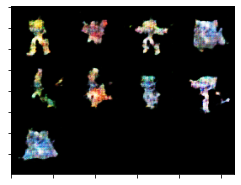

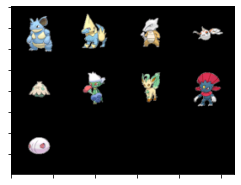

Epoch : [138 / 200] --> Generator Loss : 1.7460 , Discriminator Loss : 0.4758


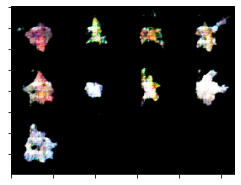

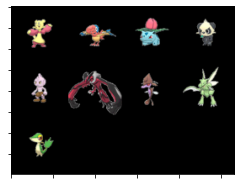

Epoch : [139 / 200] --> Generator Loss : 2.3914 , Discriminator Loss : 1.1028


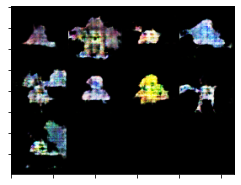

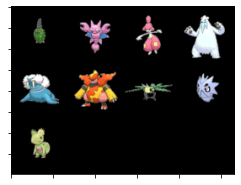

Epoch : [140 / 200] --> Generator Loss : 2.1072 , Discriminator Loss : 1.1884


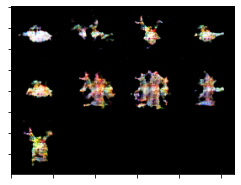

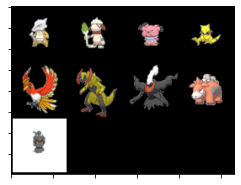

Epoch : [141 / 200] --> Generator Loss : 3.4923 , Discriminator Loss : 0.0165


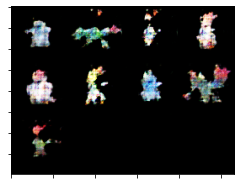

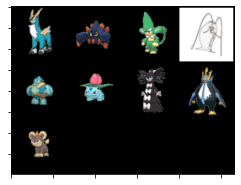

Epoch : [142 / 200] --> Generator Loss : 3.0105 , Discriminator Loss : 0.1759


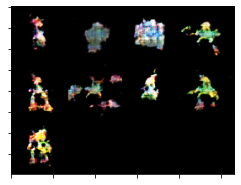

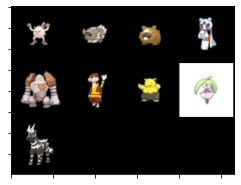

Epoch : [143 / 200] --> Generator Loss : 2.5216 , Discriminator Loss : 0.0845


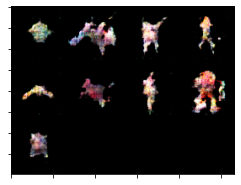

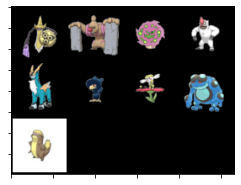

Epoch : [144 / 200] --> Generator Loss : 3.3286 , Discriminator Loss : 0.0251


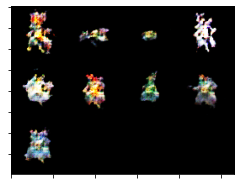

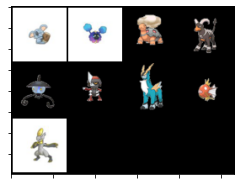

Epoch : [145 / 200] --> Generator Loss : 3.1008 , Discriminator Loss : 0.0597


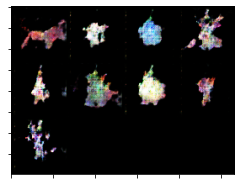

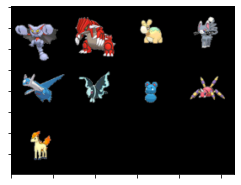

Epoch : [146 / 200] --> Generator Loss : 2.5091 , Discriminator Loss : 0.4593


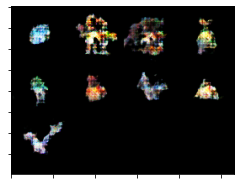

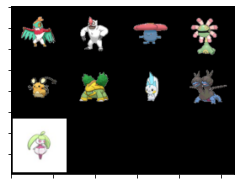

Epoch : [147 / 200] --> Generator Loss : 3.3604 , Discriminator Loss : 0.0280


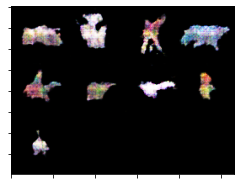

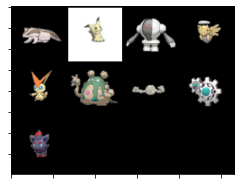

Epoch : [148 / 200] --> Generator Loss : 3.2090 , Discriminator Loss : 0.0251


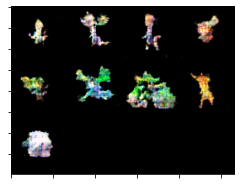

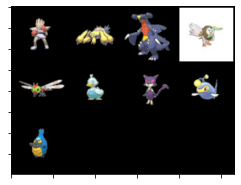

Epoch : [149 / 200] --> Generator Loss : 2.5039 , Discriminator Loss : 0.0609


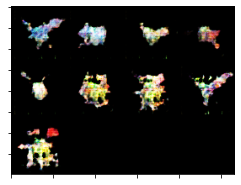

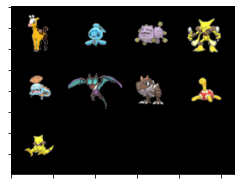

Epoch : [150 / 200] --> Generator Loss : 2.2858 , Discriminator Loss : 0.8120


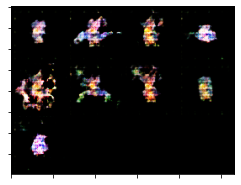

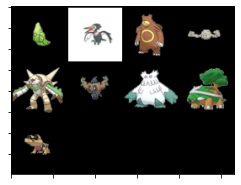

Epoch : [151 / 200] --> Generator Loss : 3.4147 , Discriminator Loss : 0.0263


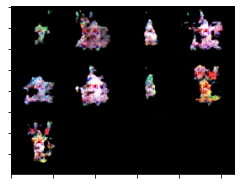

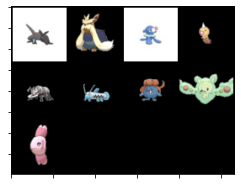

Epoch : [152 / 200] --> Generator Loss : 3.4751 , Discriminator Loss : 0.0226


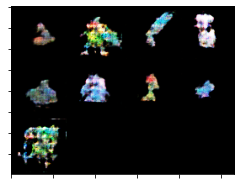

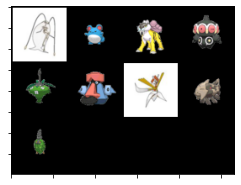

Epoch : [153 / 200] --> Generator Loss : 2.8929 , Discriminator Loss : 0.0359


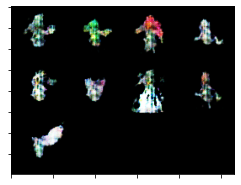

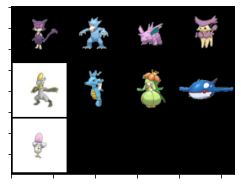

Epoch : [154 / 200] --> Generator Loss : 2.8546 , Discriminator Loss : 0.0961


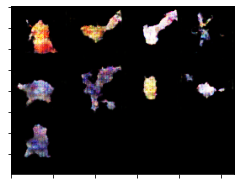

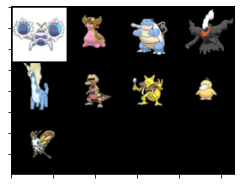

Epoch : [155 / 200] --> Generator Loss : 2.1439 , Discriminator Loss : 0.0940


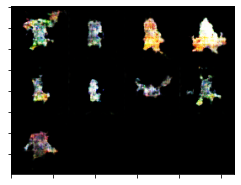

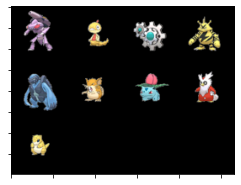

Epoch : [156 / 200] --> Generator Loss : 2.5658 , Discriminator Loss : 0.6173


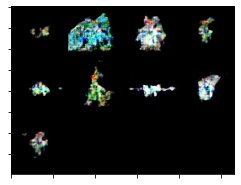

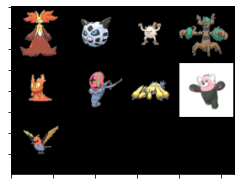

Epoch : [157 / 200] --> Generator Loss : 2.4232 , Discriminator Loss : 0.1066


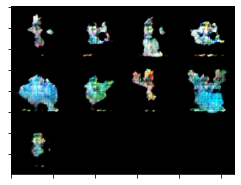

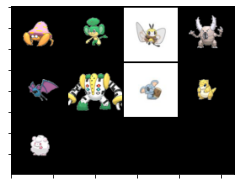

Epoch : [158 / 200] --> Generator Loss : 3.2615 , Discriminator Loss : 0.0224


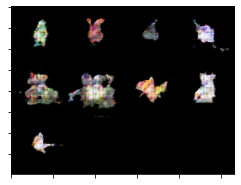

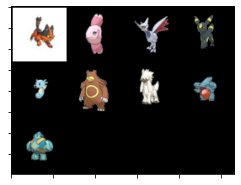

Epoch : [159 / 200] --> Generator Loss : 2.4621 , Discriminator Loss : 0.1358


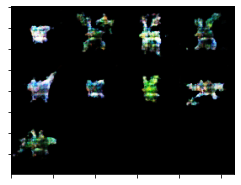

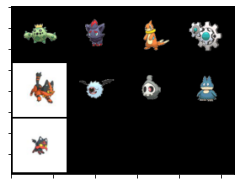

Epoch : [160 / 200] --> Generator Loss : 3.7876 , Discriminator Loss : 0.0265


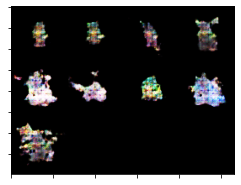

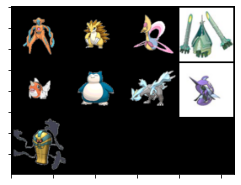

Epoch : [161 / 200] --> Generator Loss : 3.7026 , Discriminator Loss : 0.0222


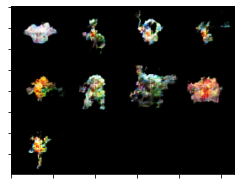

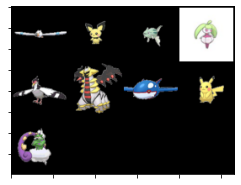

Epoch : [162 / 200] --> Generator Loss : 3.1620 , Discriminator Loss : 0.1126


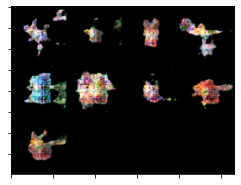

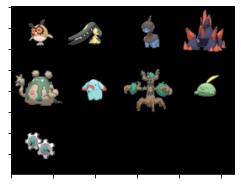

Epoch : [163 / 200] --> Generator Loss : 1.5791 , Discriminator Loss : 0.5210


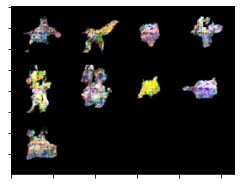

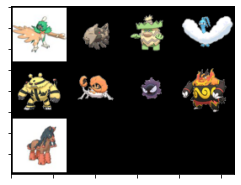

Epoch : [164 / 200] --> Generator Loss : 3.1253 , Discriminator Loss : 0.0245


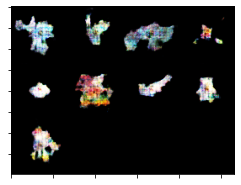

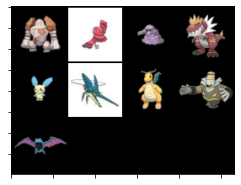

Epoch : [165 / 200] --> Generator Loss : 3.5921 , Discriminator Loss : 0.0346


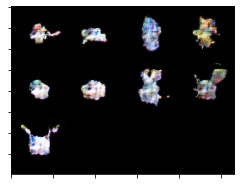

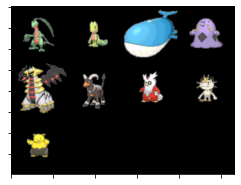

Epoch : [166 / 200] --> Generator Loss : 2.8730 , Discriminator Loss : 0.1566


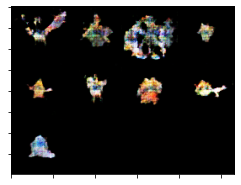

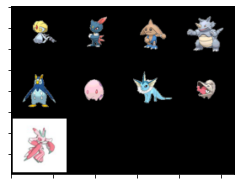

Epoch : [167 / 200] --> Generator Loss : 2.7102 , Discriminator Loss : 0.0967


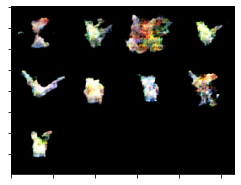

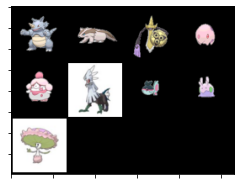

Epoch : [168 / 200] --> Generator Loss : 2.7389 , Discriminator Loss : 0.0584


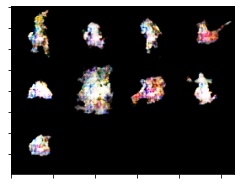

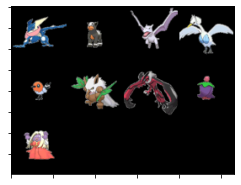

Epoch : [169 / 200] --> Generator Loss : 4.0361 , Discriminator Loss : 0.1488


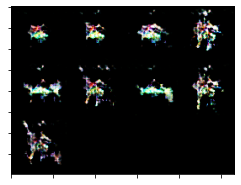

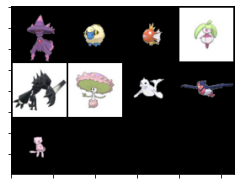

Epoch : [170 / 200] --> Generator Loss : 3.8559 , Discriminator Loss : 0.0511


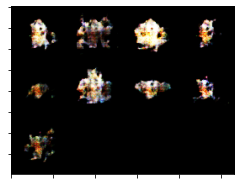

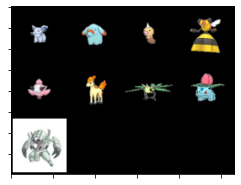

Epoch : [171 / 200] --> Generator Loss : 3.7532 , Discriminator Loss : 0.0569


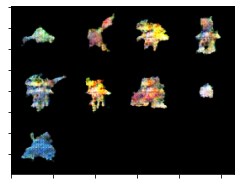

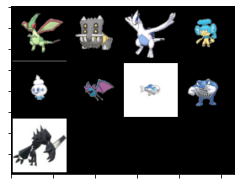

Epoch : [172 / 200] --> Generator Loss : 2.9198 , Discriminator Loss : 0.0500


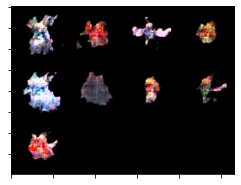

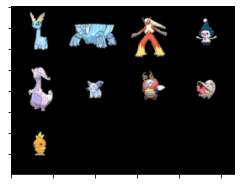

Epoch : [173 / 200] --> Generator Loss : 2.2061 , Discriminator Loss : 0.6234


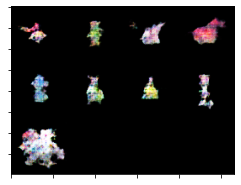

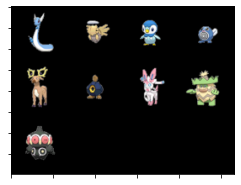

Epoch : [174 / 200] --> Generator Loss : 1.6897 , Discriminator Loss : 0.1636


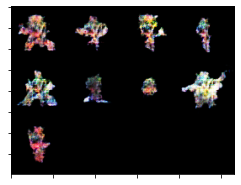

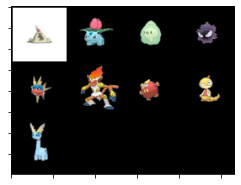

Epoch : [175 / 200] --> Generator Loss : 4.4599 , Discriminator Loss : 0.0673


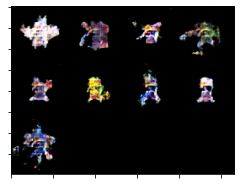

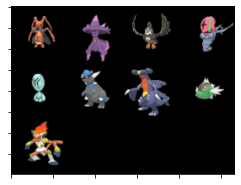

Epoch : [176 / 200] --> Generator Loss : 3.1966 , Discriminator Loss : 0.9655


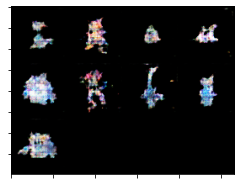

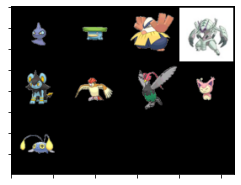

Epoch : [177 / 200] --> Generator Loss : 4.1225 , Discriminator Loss : 0.0148


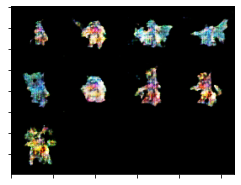

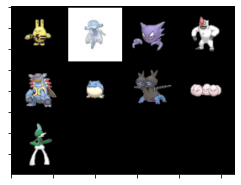

Epoch : [178 / 200] --> Generator Loss : 3.0807 , Discriminator Loss : 0.0491


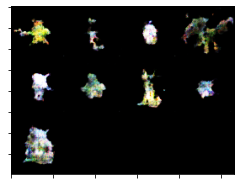

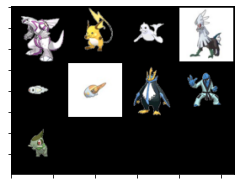

Epoch : [179 / 200] --> Generator Loss : 4.0044 , Discriminator Loss : 0.0114


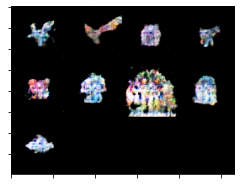

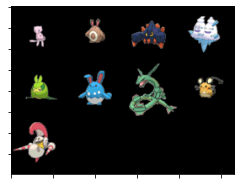

Epoch : [180 / 200] --> Generator Loss : 2.7286 , Discriminator Loss : 0.4783


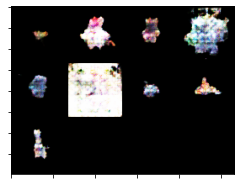

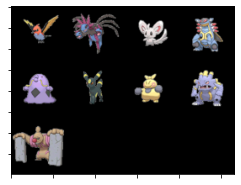

Epoch : [181 / 200] --> Generator Loss : 0.4882 , Discriminator Loss : 0.6862


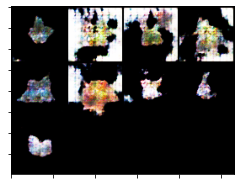

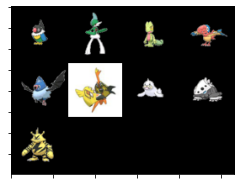

Epoch : [182 / 200] --> Generator Loss : 3.0038 , Discriminator Loss : 0.1720


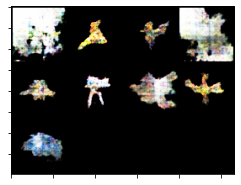

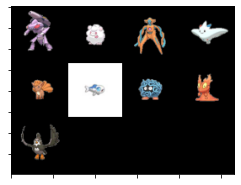

Epoch : [183 / 200] --> Generator Loss : 3.2094 , Discriminator Loss : 0.0882


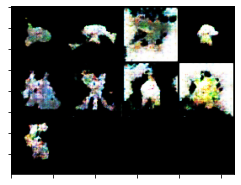

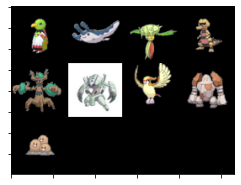

Epoch : [184 / 200] --> Generator Loss : 3.5419 , Discriminator Loss : 0.0926


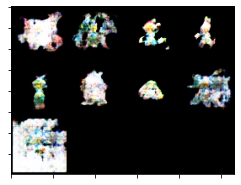

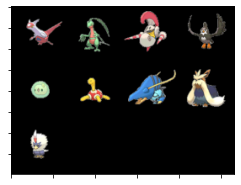

Epoch : [185 / 200] --> Generator Loss : 2.3058 , Discriminator Loss : 0.0246


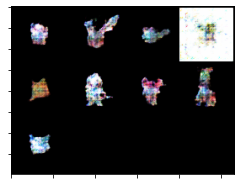

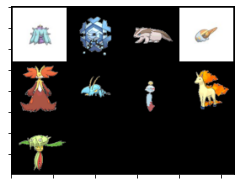

Epoch : [186 / 200] --> Generator Loss : 4.8430 , Discriminator Loss : 0.3206


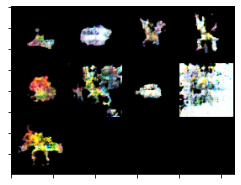

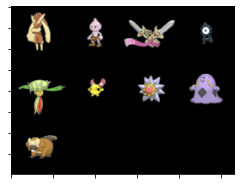

Epoch : [187 / 200] --> Generator Loss : 7.5754 , Discriminator Loss : 0.1060


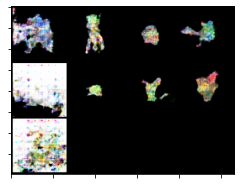

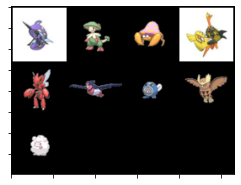

Epoch : [188 / 200] --> Generator Loss : 2.5346 , Discriminator Loss : 0.4109


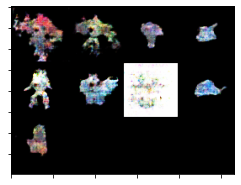

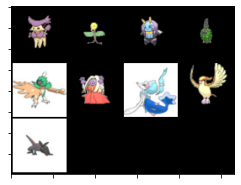

Epoch : [189 / 200] --> Generator Loss : 5.3657 , Discriminator Loss : 0.0177


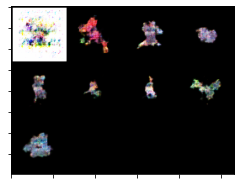

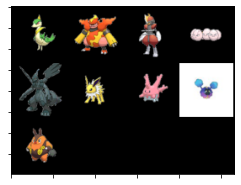

Epoch : [190 / 200] --> Generator Loss : 3.7245 , Discriminator Loss : 0.1248


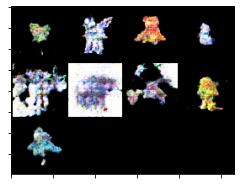

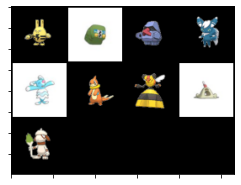

Epoch : [191 / 200] --> Generator Loss : 6.2192 , Discriminator Loss : 0.0079


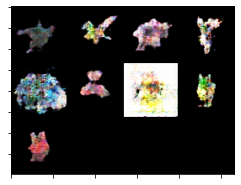

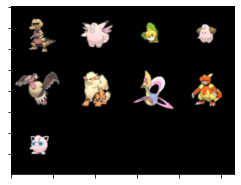

Epoch : [192 / 200] --> Generator Loss : 4.9339 , Discriminator Loss : 0.0112


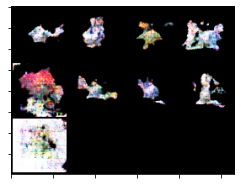

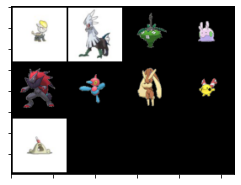

Epoch : [193 / 200] --> Generator Loss : 7.0773 , Discriminator Loss : 0.0220


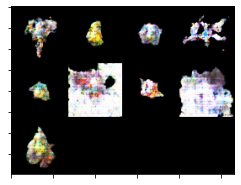

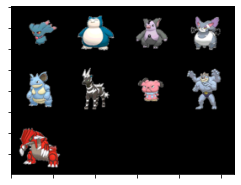

Epoch : [194 / 200] --> Generator Loss : 3.6644 , Discriminator Loss : 0.0082


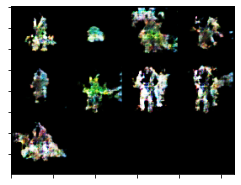

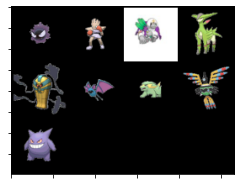

Epoch : [195 / 200] --> Generator Loss : 6.5028 , Discriminator Loss : 0.0913


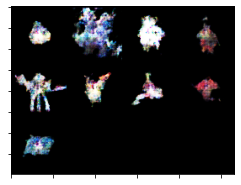

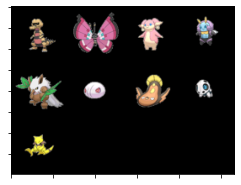

Epoch : [196 / 200] --> Generator Loss : 5.9037 , Discriminator Loss : 0.0911


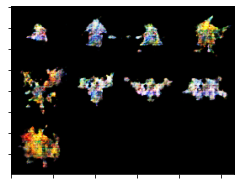

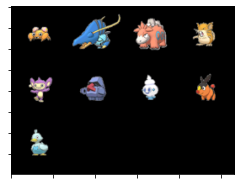

Epoch : [197 / 200] --> Generator Loss : 1.3306 , Discriminator Loss : 0.2278


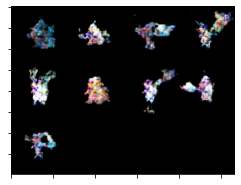

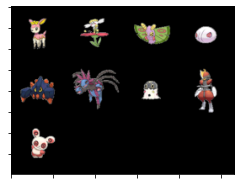

Epoch : [198 / 200] --> Generator Loss : 3.8789 , Discriminator Loss : 0.1484


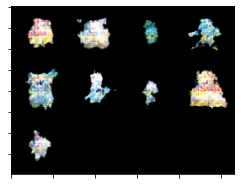

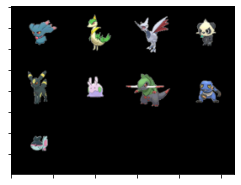

Epoch : [199 / 200] --> Generator Loss : 1.3221 , Discriminator Loss : 1.3674


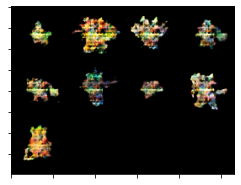

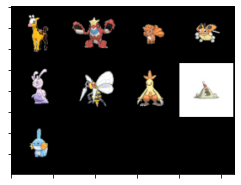

Epoch : [200 / 200] --> Generator Loss : 4.0393 , Discriminator Loss : 0.0198


In [24]:
num_epochs = 200

for epoch in range(num_epochs):
    
    for real_img , _ in pok_dl:
        
        batch_size = len(real_img)
        
        ## Train Discriminator ##
        disc_opt.zero_grad()
        
        ## Get discriminator loss ##
        disc_loss = disc_training(gen , disc , real_img , criterion , batch_size = batch_size , device = device)
        
        ## Backpropagate ##
        disc_loss.backward()
        
        ## Optimize ##
        disc_opt.step()
        
        ## Train Generator ##
        gen_opt.zero_grad()
        
        ## Get generator loss ##
        gen_loss = gen_training(gen , disc , criterion , batch_size = batch_size , device = device)
        
        ## Backpropagate ##
        gen_loss.backward()
        
        ## Optimize ##
        gen_opt.step()
        
    noise = generate_noise(batch_size , 100 , device)
    
    gen_img = gen(noise).detach()
    
    vis_img(gen_img)
    
    vis_img(real_img)
    
    print('Epoch : [{} / {}] --> Generator Loss : {:.4f} , Discriminator Loss : {:.4f}'.format(epoch + 1 , num_epochs , gen_loss , disc_loss))
    